In [1]:
import torch
import matplotlib.pyplot as plt

import robustness_model

/Users/sang-geon/Documents/UCI_BIASLab/HDC_Robustness/venv/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
def gen_datapoints(original_dim, mean1, mean2, std1, std2):
    
    X1 = torch.empty(10, original_dim).normal_(mean=mean1,std=std1)
    X2 = torch.empty(10, original_dim).normal_(mean=mean2,std=std2)

    X = torch.concatenate((X1, X2), dim=0)
    y = torch.tensor([0 for _ in range(len(X1))] + [1 for _ in range(len(X2))])

    return X, y


def get_eps(model, q, L):
    phi_diff = model.class_hvs1 - model.class_hvs2
    phi_q = model.encoder(q.reshape(1, -1))
    r_q = model.encoder.inner(phi_diff.reshape(1, -1), phi_q)[0, 0]
    return torch.abs(r_q) / L


def get_boundary_locs(qs, sims):
    boundary_locs = []
    for i in range(len(qs) - 1):
        if(sims[i] * sims[i+1] <= 0):
            boundary_locs.append(qs[i])
    return torch.tensor(boundary_locs)


def plot_1d_epsilon(model, X, y, title=''):

    X1, X2 = X[y == 0], X[y == 1]

    vmin, vmax = X.min() - 10, X.max() + 10
    
    qs = torch.linspace(vmin, vmax, 1000).reshape(-1, 1)
    qs_enc = model.encoder(qs)
    sims = torch.tensor([model.encoder.inner(phi_q.reshape(1, -1), (model.class_hvs1 - model.class_hvs2).reshape(1, -1)) for phi_q in qs_enc])

    boundary_locs = get_boundary_locs(qs, sims)

    ds = [] # Actual
    es1 = [] # Method 1
    es2_r2 = [] # Method 2 (r=2)
    # es2_r5 = [] # Method 2 (r=5)
    es3 = [] # Method 3

    for i in range(len(qs)):
        q = qs[i]
        sim = sims[i]
        d = torch.min(torch.abs(boundary_locs - q))

        L1 = model.get_linear_approximation(q)
        L2_r2 = model.get_conservative_lipschitz_constant(q)
        L2_r5 = model.get_conservative_lipschitz_constant(q, r=5)
        L3 = model.get_lipschitz_constant()

        e1 = get_eps(model, q, L1)
        e2_r2 = get_eps(model, q, L2_r2)
        # e2_r5 = get_eps(model, q, L2_r5)
        e3 = get_eps(model, q, L3)

        ds.append(d)
        es1.append(e1)
        es2_r2.append(e2_r2)
        # es2_r5.append(e2_r5)
        es3.append(e3)

    fig, axes = plt.subplots(1, 3, dpi=500, figsize=(20, 5))

    axes[0].fill_between(qs.reshape(-1), 0, 1, where=sims.reshape(-1) >= 0,
                    color='blue', alpha=0.3, transform=axes[0].get_xaxis_transform())
    axes[0].fill_between(qs.reshape(-1), 0, 1, where=sims.reshape(-1) < 0,
                    color='red', alpha=0.3, transform=axes[0].get_xaxis_transform())
    axes[0].plot(qs, sims, label="Similarity", linewidth=2.,)
    axes[0].scatter(X1, torch.zeros(len(X1)), color='blue')
    axes[0].scatter(X2, torch.zeros(len(X2)), color='red')
    axes[0].set_xlabel("$x$")
    #axes[0].legend()

    colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple']

    axes[1].plot(qs, ds, label="Actual", color=colors[0], linewidth=2.,)
    axes[1].plot(qs, es1, label="Method 1", color=colors[1], linewidth=2.,)
    axes[1].plot(qs, es2_r2, label="Method 2 (r=2)", color=colors[2], linewidth=2.,)
    # axes[1].plot(qs, es2_r5, label="Method 2 (r=5)", color=colors[3], linewidth=2.,)
    axes[1].plot(qs, es3, label="Method 3", color=colors[4], linewidth=2.,)
    axes[1].scatter(X1, torch.zeros(len(X1)), color='blue')
    axes[1].scatter(X2, torch.zeros(len(X2)), color='red')
    axes[1].set_xlabel("$x$")
    axes[1].set_ylabel("$\epsilon$")
    #axes[1].legend()
    
    axes[2].plot(qs, ds, label="Actual", color=colors[0], linewidth=2.,)
    # axes[2].plot(qs, es1, label="Method 1", color=colors[1], linewidth=2.,)
    axes[2].plot(qs, es2_r2, label="Method 2 (r=2)", color=colors[2], linewidth=2.,)
    # axes[2].plot(qs, es2_r5, label="Method 2 (r=5)", color=colors[3], linewidth=2.,)
    axes[2].plot(qs, es3, label="Method 3", color=colors[4], linewidth=2.,)
    axes[2].scatter(X1, torch.zeros(len(X1)), color='blue')
    axes[2].scatter(X2, torch.zeros(len(X2)), color='red')
    axes[2].set_xlabel("$x$")
    axes[2].set_ylabel("$\epsilon$")
    axes[2].set_ylim([-0.1, max(ds) + 0.1])
    #axes[2].legend()

    fig.suptitle(title)

    fig.show()

In [8]:
def run_1d_test(original_dim, dim, mean1, mean2, std1, std2):
    
    X, y = gen_datapoints(original_dim, mean1, mean2, std1, std2)

    encoder = robustness_model.FHRREncoder(original_dim, dim)
    model = robustness_model.ClassificationModel(encoder, in_dim=original_dim, dim=dim)
    model.bundling(X, y)
    model.class_hvs1.shape, model.class_hvs2.shape

    print('Method1', model.get_linear_approximation(X[0]))
    print('Method1 (autograd)', model.get_linear_approximation_autograd(X[0]))
    print('Method2', model.get_conservative_lipschitz_constant(X[0]))
    print('Method3', model.get_lipschitz_constant())
    print('Method3 (autograd)', model.get_lipschitz_constant_autograd())

    plot_1d_epsilon(model, X, y, 
                    title=f'dim={dim}, class1$\in N({mean1}, {std1}^2)$, class2$\in N({mean2}, {std2}^2)$')

In [9]:
original_dim = 1
dim = 4000

Method1 tensor(3848.7004)
Method1 (autograd) tensor(3848.6987)
Method2 tensor(7992.0928)
Method3 tensor(539.3672)
Method3 (autograd) tensor(539.3672)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_15750/1695615168.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


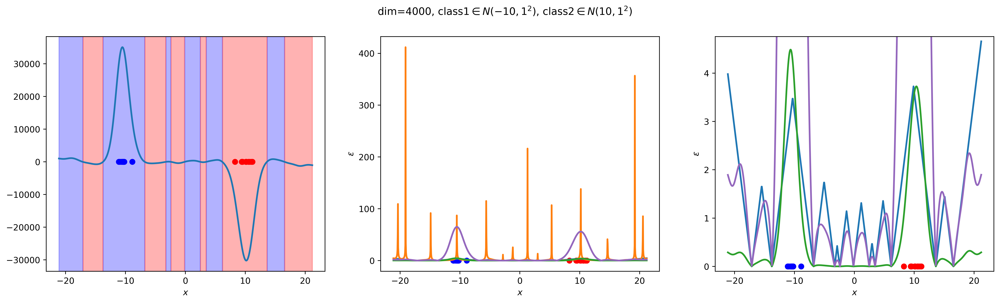

In [14]:
run_1d_test(original_dim, dim, -10, 10, 1, 1)

Method1 tensor(13674.7432)
Method1 (autograd) tensor(13674.7520)
Method2 tensor(7114.0552)
Method3 tensor(637.0261)
Method3 (autograd) tensor(637.0261)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_15750/1695615168.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


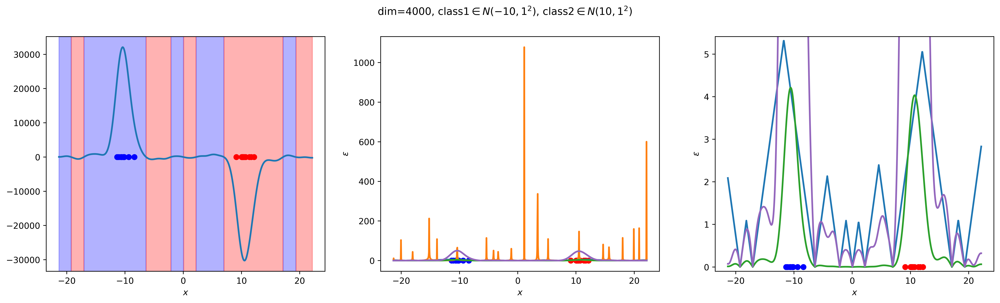

In [16]:
run_1d_test(original_dim, dim, -10, 10, 1, 1)

Method1 tensor(19410.5742)
Method1 (autograd) tensor(19410.5664)
Method2 tensor(9603.0996)
Method3 tensor(726.1909)
Method3 (autograd) tensor(726.1909)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_15750/1695615168.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


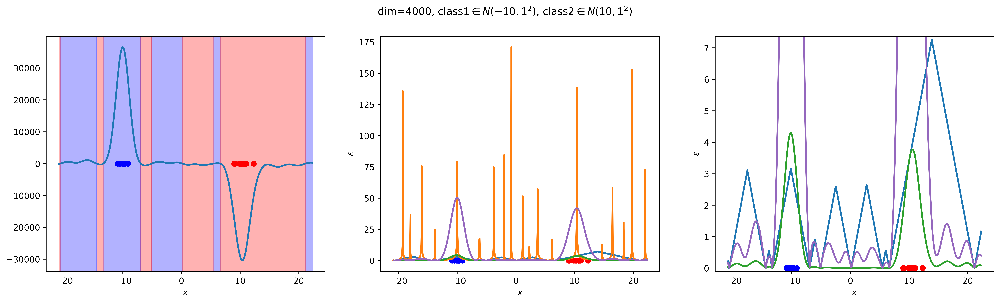

In [17]:
run_1d_test(original_dim, dim, -10, 10, 1, 1)

Method1 tensor(11968.8594)
Method1 (autograd) tensor(11968.8623)
Method2 tensor(9173.7275)
Method3 tensor(402.1838)
Method3 (autograd) tensor(402.1838)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_15750/1695615168.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


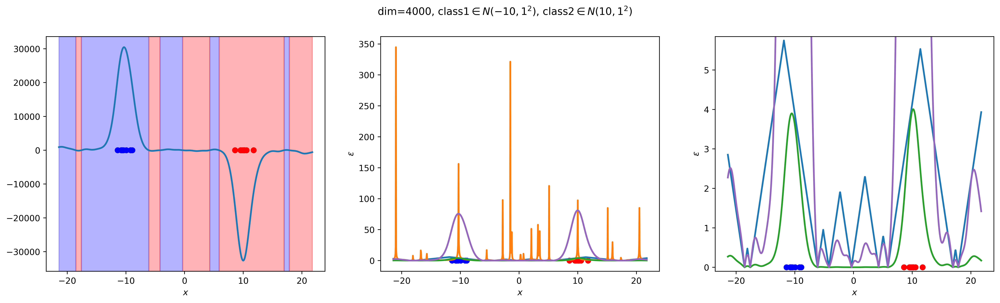

In [18]:
run_1d_test(original_dim, dim, -10, 10, 1, 1)

Method1 tensor(3566.8936)
Method1 (autograd) tensor(3566.8965)
Method2 tensor(14813.1816)
Method3 tensor(5526.6626)
Method3 (autograd) tensor(5526.6626)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_15750/1695615168.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


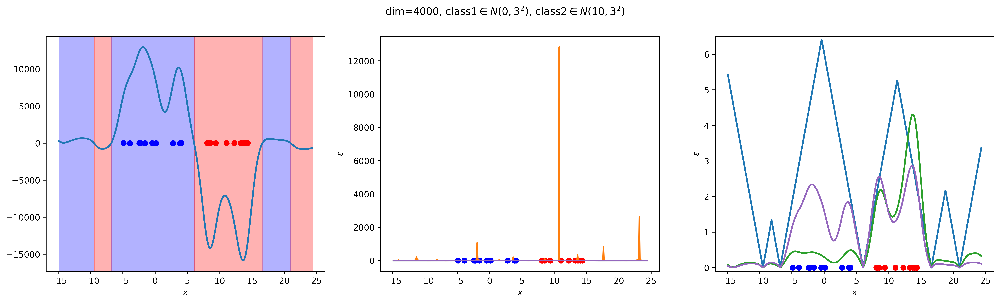

In [13]:
run_1d_test(original_dim, dim, 0, 10, 3, 3)

Method1 tensor(4301.2646)
Method1 (autograd) tensor(4301.2622)
Method2 tensor(15867.2236)
Method3 tensor(7480.2236)
Method3 (autograd) tensor(7480.2236)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_15750/1695615168.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


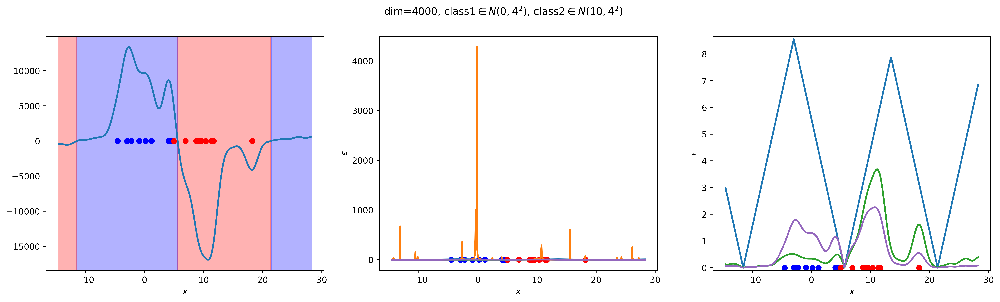

In [15]:
run_1d_test(original_dim, dim, 0, 10, 4, 4)

Method1 tensor(6342.1162)
Method1 (autograd) tensor(6342.1123)
Method2 tensor(39858.5078)
Method3 tensor(12559.0547)
Method3 (autograd) tensor(12559.0547)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_15750/1695615168.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


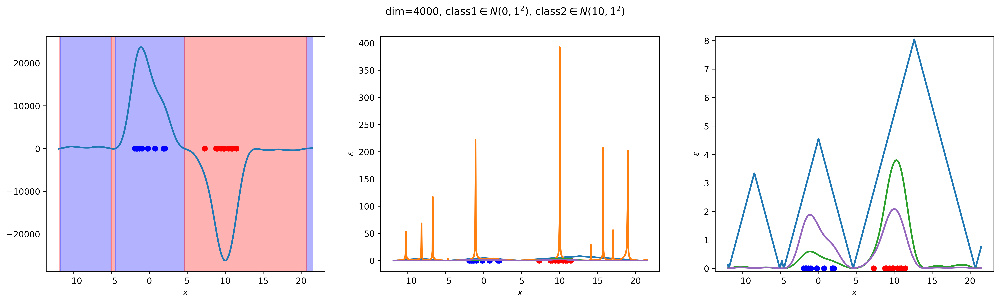

In [11]:
run_1d_test(original_dim, dim, 0, 10, 1, 1)

Method1 tensor(15070.9834)
Method1 (autograd) tensor(15070.9727)
Method2 tensor(6765.3599)
Method3 tensor(1026.8086)
Method3 (autograd) tensor(1026.8086)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_1504/2486744129.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


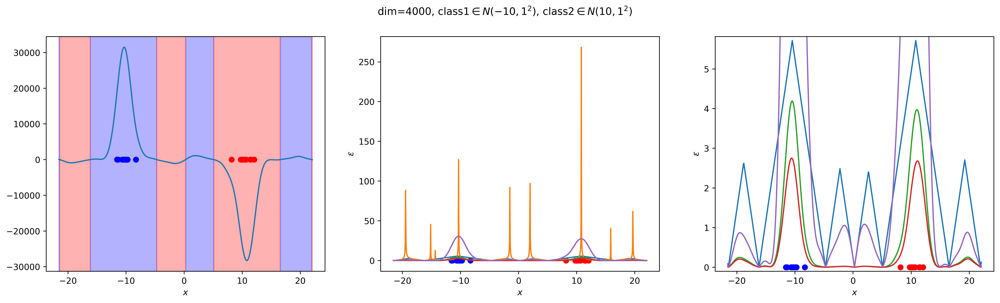

In [5]:
run_1d_test(original_dim, dim, -10, 10, 1, 1)

Method1 tensor(15734.9795)
Method1 (autograd) tensor(15734.9824)
Method2 tensor(44801.5391)
Method3 tensor(18467.7051)
Method3 (autograd) tensor(18467.7051)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_1504/2486744129.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


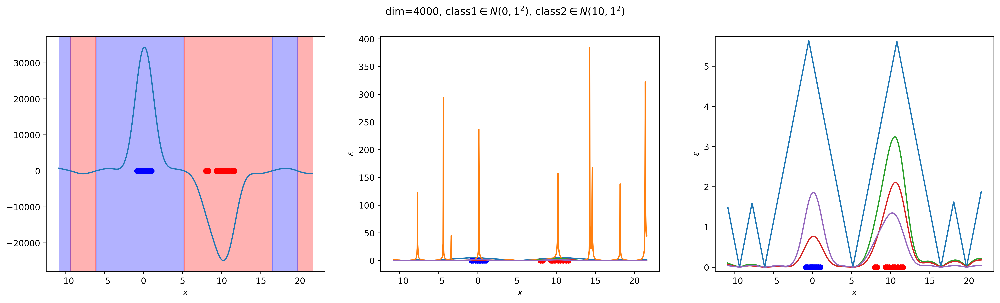

In [10]:
run_1d_test(original_dim, dim, 0, 10, 1, 1)

Method1 tensor(530.1724)
Method1 (autograd) tensor(530.1719)
Method2 tensor(40320.8711)
Method3 tensor(9184.0312)
Method3 (autograd) tensor(9184.0312)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_1504/2486744129.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


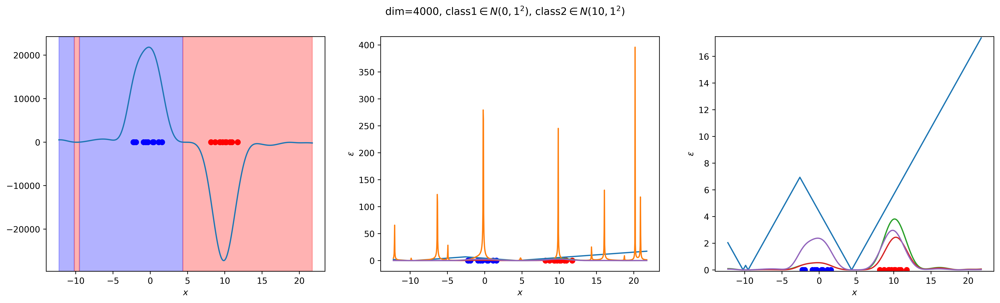

In [11]:
run_1d_test(original_dim, dim, 0, 10, 1, 1)

Method1 tensor(14025.5781)
Method1 (autograd) tensor(14025.5859)
Method2 tensor(44215.4141)
Method3 tensor(16412.8691)
Method3 (autograd) tensor(16412.8691)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_1504/2486744129.py:105: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


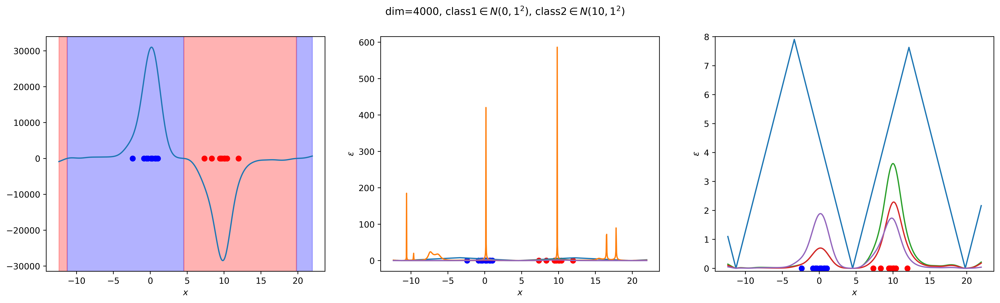

In [12]:
run_1d_test(original_dim, dim, 0, 10, 1, 1)

In [7]:
run_1d_test(original_dim, dim, 0, 5, 1, 1)

Method1 tensor(12180.0361)
Method1 (autograd) tensor(12180.0352)
Method2 tensor(41862.8086)
Method3 tensor(23159.1094)
Method3 (autograd) tensor(23159.1094)


KeyboardInterrupt: 

Method1 tensor(31244.9531)
Method1 (autograd) tensor(31244.9668)
Method2 tensor(41966.2695)
Method3 tensor(31740.1777)
Method3 (autograd) tensor(31740.1777)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_35321/228374255.py:103: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


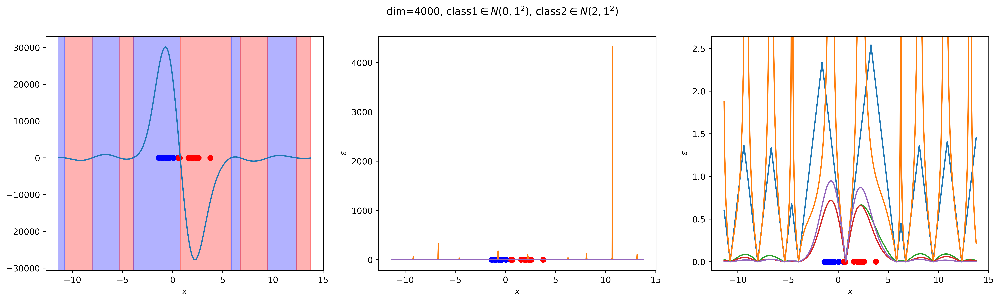

In [ ]:
run_1d_test(original_dim, dim, 0, 2, 1, 1)

Method1 tensor(3625.0464)
Method1 (autograd) tensor(3625.0474)
Method2 tensor(3677.8435)
Method3 tensor(2558.0142)
Method3 (autograd) tensor(2558.0142)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_35321/228374255.py:103: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


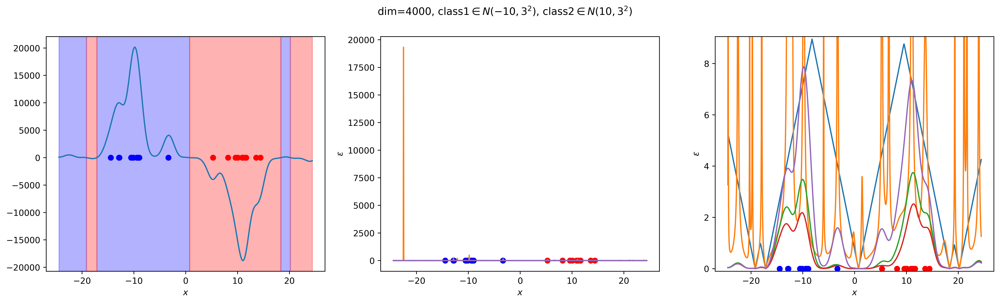

In [ ]:
run_1d_test(original_dim, dim, -10, 10, 3, 3)

Method1 tensor(1864.8667)
Method1 (autograd) tensor(1864.8671)
Method2 tensor(26416.4512)
Method3 tensor(4878.3091)
Method3 (autograd) tensor(4878.3091)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_35321/228374255.py:103: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


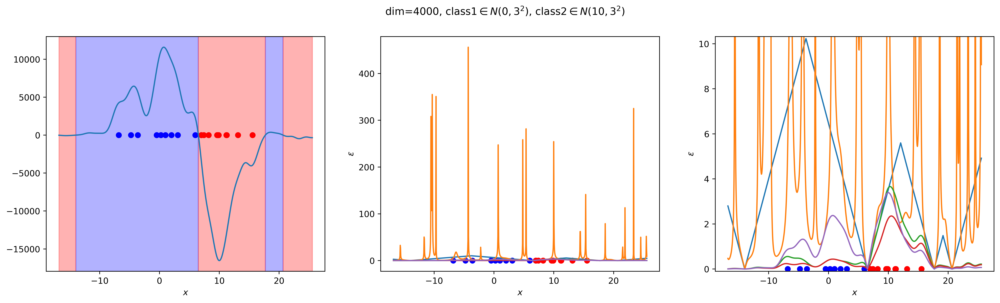

In [ ]:
run_1d_test(original_dim, dim, 0, 10, 3, 3)

Method1 tensor(9175.9883)
Method1 (autograd) tensor(9175.9824)
Method2 tensor(21434.2344)
Method3 tensor(11848.4072)
Method3 (autograd) tensor(11848.4072)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_35321/228374255.py:103: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


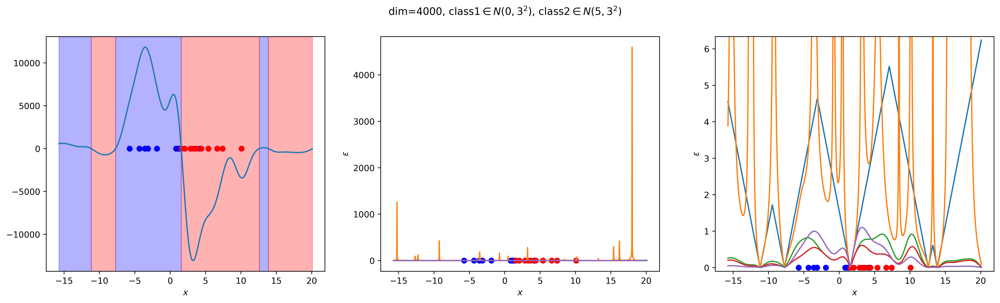

In [ ]:
run_1d_test(original_dim, dim, 0, 5, 3, 3)

Method1 tensor(438.1754)
Method1 (autograd) tensor(438.1753)
Method2 tensor(16916.3867)
Method3 tensor(11225.9268)
Method3 (autograd) tensor(11225.9268)


/var/folders/0d/85ds7j1x59j1dwn1s6nph45m0000gn/T/ipykernel_35321/228374255.py:103: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


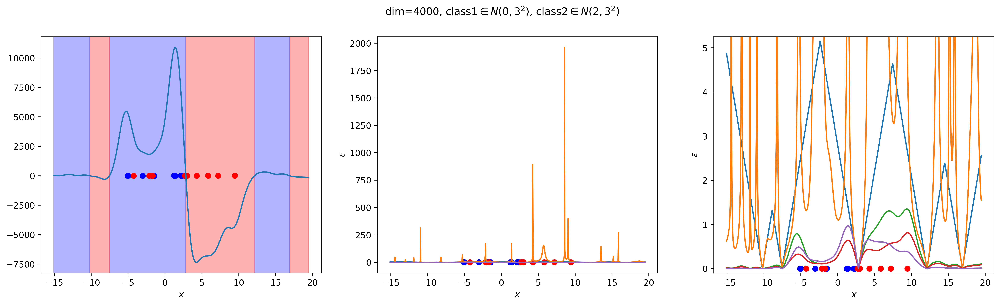

In [ ]:
run_1d_test(original_dim, dim, 0, 2, 3, 3)